In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import yfinance as yf
from datetime import datetime
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.ForecasterAutoregDirect import ForecasterAutoregDirect
import math

In [2]:

class ETL:
    """
    ticker: str
    period: string
    test_size: float betwee 0 and 1
    n_input: int
    timestep: int
    Extracts data for stock with ticker `ticker` from yf api,
    splits the data into train and test sets by date,
    reshapes the data into np.array of shape [#weeks, 5, 1],
    converts our problem into supervised learning problem.
    """

    def __init__(self, datainput, test_size=0.2, n_input=5, timestep=5, normalize_bool=False, scaler=None, target_col=None) -> None:
        self.datainput = datainput
        self.test_size = test_size
        self.n_input = n_input
        self.timestep = timestep
        self.normalize_bool = normalize_bool
        self.scaler = scaler
        self.target_col = target_col
        self.df = self.extract_historic_data()
        self.train, self.test = self.etl()
        self.X_train, self.y_train = self.to_supervised(self.train)
        self.X_test, self.y_test = self.to_supervised(self.test)

        if self.normalize_bool:
            print('normalized', normalize_bool)
            self.scaler = scaler
        else:
            print('not normalized', normalize_bool)
            self.scaler = None

    def extract_historic_data(self) -> pd.DataFrame:
        if self.normalize_bool:
            data = self.scaler.fit_transform(self.datainput)
            return pd.DataFrame(data, columns=self.datainput.columns)
        else:
            return self.datainput

    def split_data(self) -> tuple:
        """
        Splits our pd.Series into train and test series with
        test series representing test_size * 100 % of data.
        """
        # data = self.extract_historic_data()
        data = self.df
        if len(data) != 0:
            train_idx = round(len(data) * (1 - self.test_size))
            train = data.iloc[:train_idx]
            test = data.iloc[train_idx:]
            return train, test
        else:
            raise Exception('Data set is empty, cannot split.')

    def window_and_reshape(self, data) -> np.array:
        """
        Reformats data into shape our model needs.
        """
        samples = data.shape[0] // self.timestep
        if samples <= 0:
            raise ValueError(
                "The number of samples is less than or equal to 0. Ensure data length is greater than timestep.")
        result = np.array_split(data[:samples * self.timestep], samples)
        return np.array(result)

    def transform(self, train, test) -> np.array:
        train_remainder = train.shape[0] % self.timestep
        test_remainder = test.shape[0] % self.timestep
        if train_remainder != 0:
            train = train[:-(train_remainder)]
        if test_remainder != 0:
            test = test[:-(test_remainder)]
        # print("train:", train, "test:", test)
        if len(train) < self.timestep or len(test) < self.timestep:
            raise ValueError(
                "Not enough data to form at least one timestep window.")
        train_transformed, test_transformed = self.window_and_reshape(
            train), self.window_and_reshape(test)
        print(f'train_transformed shape: {train_transformed.shape}')
        print(f'test_transformed shape: {test_transformed.shape}')
        return train_transformed, test_transformed

    def etl(self) -> tuple[np.array, np.array]:
        """
        Runs complete ETL
        """
        train, test = self.split_data()
        print("train:", train, "test:", test)
        return self.transform(train, test)

    def to_supervised(self, data, n_out=5) -> tuple:
        X, y = [], []
        for sample in data:
            if len(sample) >= self.n_input + n_out:
                for i in range(len(sample) - self.n_input - n_out + 1):
                    X.append(sample[i:i + self.n_input])
                    y.append(sample[i + self.n_input:i +
                             self.n_input + n_out, :])
        print(len(sample) - self.n_input - n_out + 1)
        X, y = np.array(X), np.array(y)
        print(f'X shape: {X.shape}')
        print(f'y shape: {y.shape}')
        return X, y

In [3]:
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0.2, epsilon=1e-6, attention_axes=None, kernel_size=1):
    x = layers.LayerNormalization(epsilon=epsilon)(inputs)
    attention_output, _ = layers.MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout,
        attention_axes=attention_axes
    )(x, x, return_attention_scores=True)
    x = layers.Dropout(dropout)(attention_output)
    res = x + inputs

    # Feed Forward Part
    x = layers.LayerNormalization(epsilon=epsilon)(res)
    x = layers.Conv1D(filters=ff_dim, kernel_size=kernel_size,
                      activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    x = layers.Conv1D(filters=inputs.shape[-1], kernel_size=kernel_size)(x)
    return x + res


def build_transformer(head_size, num_heads, ff_dim, num_trans_blocks, mlp_units, dropout=0.2, mlp_dropout=0.2, attention_axes=None, epsilon=1e-6, kernel_size=1):
    n_timesteps, n_features, n_outputs = 5, 10, 50
    inputs = tf.keras.Input(shape=(n_timesteps, n_features))
    masked_inputs = layers.Masking()(inputs)
    # x = inputs
    x = masked_inputs
    for _ in range(num_trans_blocks):
        x = transformer_encoder(x, head_size=head_size, num_heads=num_heads, ff_dim=ff_dim,
                                dropout=dropout, attention_axes=attention_axes, kernel_size=kernel_size, epsilon=epsilon)
    x = layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    for dim in mlp_units:
        x = layers.Dense(dim, activation="relu")(x)
        x = layers.Dropout(mlp_dropout)(x)
    outputs = layers.Dense(n_outputs)(x)
    outputs = layers.Reshape((n_timesteps, n_features))(outputs)
    return tf.keras.Model(inputs, outputs)


def fit_transformer(transformer, x_train, y_train, x_val, y_val, display_loss=False):
    transformer.compile(
        loss="mse",
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        metrics=["mae", 'mape']
    )

    callbacks = [tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=10, restore_best_weights=True)]

    hist = transformer.fit(x_train, y_train,
                           validation_data=(x_val, y_val),
                           batch_size=32, epochs=25,
                           verbose=1, callbacks=callbacks)

    if display_loss:
        history_df = pd.DataFrame(hist.history)
        history_df['val_loss'].plot()
        plt.title('Validation Loss')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Validation'], loc='upper right')
        plt.show()
        history_df['loss'].plot()
        plt.title('Training Loss')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train'], loc='upper right')
        plt.show()

        history_df.loc[:, ['mae', 'val_mae']].plot()
        plt.title('Model MAE')
        plt.ylabel('MAE')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper right')
        plt.show()

    return hist

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


class PredictAndForecast:
    def __init__(self, model, train, test, n_input=30) -> None:
        self.model = model
        self.train = train
        self.test = test
        self.n_input = n_input
        # self.predictions = self.get_predictions()

    def forecast(self, history) -> np.array:
        """
        Given last weeks actual data, forecasts next weeks prices.
        """
        # flatten data
        data = np.array(history)
        data = data.reshape((data.shape[0] * data.shape[1], data.shape[2]))

        # retrieve last observations for input data
        input_x = data[-self.n_input:, :]

        input_x = input_x.reshape((1, self.n_input, input_x.shape[1]))

        # forecast the next week
        yhat = self.model.predict(input_x, verbose=0)

        # we only want the vector forecast
        yhat = yhat[0]
        return yhat

    def get_predictions(self, step) -> np.array:
        """
        Compiles models predictions week by week over entire
        test set.
        """
        # history is a list of weekly data
        history = [x for x in self.train]

        # walk-forward validation over each week
        predictions = []
        for i in range(len(self.test)):
            yhat_sequence = self.forecast(history)
            predictions.append(yhat_sequence)
            history.append(self.test[i, :])
        if step > len(self.test):
            for _ in range(step - len(self.test)):
                yhat_sequence = self.forecast(history)
                predictions.append(yhat_sequence)
                history.append(yhat_sequence)

        predictions = np.array(predictions)
        print(f"Predictions shape: {predictions.shape}")
        return predictions

    def recursive_predict(self, steps: int) -> pd.Series:
        print("************************")
        train_series = pd.Series(self.train.flatten())
        test_series = pd.Series(self.test.flatten())
        print(f"Initial training series:\n{train_series}\n")
        print(f"train value {train_series}")
        print(f"origin value {test_series}")
        print("***********************")
        forecaster = ForecasterAutoreg(
            regressor=LinearRegression(), lags=self.n_input)

        predictions = []
        history = train_series
        # history = list(train_series)
        forecaster.fit(y=train_series)
        n = len(train_series)
        P = np.zeros(n)  # Estimated error covariance
        Q = 1e-5  # Process noise covariance
        R = 4
        smoothed_value = train_series.iloc[-1]
        P[-1] = 1
        for step in range(steps):
            # forecaster.fit(y=pd.Series(history))
            next_prediction = forecaster.predict(steps=1)
            predicted_value = next_prediction.values[0]
            original_value = test_series[step] if step < len(
                test_series) else None

            print(f"Step {step + 1}:")
            print(f"Predicted value: {predicted_value}")
            print(f"Original value: {original_value}")
            print(f"next prediction:{next_prediction}")
            if original_value is not None:
                # Kalman filter update
                P_pred = P[-1] + Q  # Prediction of error covariance
                K = P_pred / (P_pred + R)  # Kalman Gain
                smoothed_value = smoothed_value + K * \
                    (original_value - smoothed_value)  # Update step
                P[-1] = (1 - K) * P_pred  # Update error covariance
                adjusted_prediction = smoothed_value
                print(f"Kalman adjusted prediction: {adjusted_prediction}")
            else:
                adjusted_prediction = predicted_value
                print("No original value to compare. Using predicted value.")

            predictions.append(adjusted_prediction)
            history = pd.concat([history, pd.Series([predicted_value], index=pd.RangeIndex(
                start=len(history), stop=len(history)+1))])
            forecaster.fit(y=history)

        prediction_series = pd.Series(predictions, index=pd.date_range(
            start=history.index[-steps], periods=steps, freq='D'))

        print(f"Final prediction series:\n{prediction_series}\n")
        return prediction_series

    def direct_predict(self, steps: int) -> pd.Series:
        # train_series = pd.Series(self.train.flatten(), index=pd.date_range(
        #     start='2000', periods=len(self.train.flatten())))
        train_series = pd.Series(self.train.flatten())

        max_steps = min(steps, len(train_series) - self.n_input)

        forecaster = ForecasterAutoregDirect(
            regressor=LinearRegression(), lags=self.n_input, steps=max_steps)
        forecaster.fit(y=train_series)
        predictions = forecaster.predict()
        prediction_series = pd.Series(predictions.values, index=pd.date_range(
            start=train_series.index[-1], periods=max_steps + 1, freq='D')[1:])
        return prediction_series

    def plot_predictions(self, steps: int, preds, normaliza_bool, scaler) -> None:
        recursive_prediction_series = self.recursive_predict(
            steps)
        direct_prediction_series = self.direct_predict(steps)

        # Ensure both predictions have the same length
        min_steps = min(len(recursive_prediction_series),
                        len(direct_prediction_series))
        recursive_prediction_series = recursive_prediction_series[:min_steps]
        direct_prediction_series = direct_prediction_series[:min_steps]

        plot_preds = preds[:min_steps]
        # Flatten self.train for plotting
        # Flatten to 2D (samples, features)
        train_series = self.train.reshape(-1, self.train.shape[-1])
        test_series = self.test.reshape(-1, self.test.shape[-1])

        if normaliza_bool:

            num_features = scaler.scale_.shape[0]
            reshaped_recursive = np.repeat(
                recursive_prediction_series.values.reshape(-1, 1), num_features, axis=1)
            reshaped_direct = np.repeat(
                direct_prediction_series.values.reshape(-1, 1), num_features, axis=1)
            reshaped_preds = np.repeat(
                plot_preds.reshape(-1, 1), num_features, axis=1)

            inverse_recursive = scaler.inverse_transform(reshaped_recursive)[
                :, 0]
            inverse_direct = scaler.inverse_transform(reshaped_direct)[:, 0]
            inverse_preds = scaler.inverse_transform(reshaped_preds)[:, 0]

            recursive_prediction_series = pd.Series(
                inverse_recursive, index=recursive_prediction_series.index)
            direct_prediction_series = pd.Series(
                inverse_direct, index=direct_prediction_series.index)
            plot_preds = inverse_preds

            train_series_2d = train_series.reshape(-1, num_features)
            test_series_2d = test_series.reshape(-1, num_features)

            # Apply inverse_transform on flattened 2D arrays
            train_series = scaler.inverse_transform(train_series_2d).flatten()
            test_series = scaler.inverse_transform(test_series_2d).flatten()

        plt.figure(figsize=(10, 6))
        # Plot the training data
        plt.plot(range(len(train_series)), train_series, label='Training Data')

        # Plot the test data
        test_start_index = len(train_series)
        plt.plot(range(test_start_index, test_start_index +
                 len(test_series)), test_series, label='Origin Data', color='black', marker='o', ms=1)

        # Adjust prediction indices to align with the start of the test data
        prediction_start_index = test_start_index
        plt.plot(range(prediction_start_index, prediction_start_index + min_steps), plot_preds,
                 label='Hybrid Predictions', linestyle='--', color='green')
        plt.plot(range(prediction_start_index, prediction_start_index + min_steps), recursive_prediction_series,
                 label='Recursive Predictions', color='red')
        plt.plot(range(prediction_start_index, prediction_start_index + min_steps), direct_prediction_series,
                 label='Direct Predictions', color='purple')

        plt.xlabel('Time Steps')
        plt.ylabel('Values')
        plt.title(f'Transformer Model Predictions {steps} steps ahead')
        plt.legend()
        plt.show()
        return test_series[:min_steps], recursive_prediction_series, direct_prediction_series, plot_preds

    def evaluate_predictions(self, test_series, recursive_preds, direct_preds, hybrid_preds):
        metrics = {
            'recursive': {
                'MAE': mean_absolute_error(test_series, recursive_preds),
                'MAPE': mean_absolute_percentage_error(test_series, recursive_preds),
                'RMSE': np.sqrt(mean_squared_error(test_series, recursive_preds)),
                'R2': r2_score(test_series, recursive_preds)
            },
            'direct': {
                'MAE': mean_absolute_error(test_series, direct_preds),
                'MAPE': mean_absolute_percentage_error(test_series, direct_preds),
                'RMSE': np.sqrt(mean_squared_error(test_series, direct_preds)),
                'R2': r2_score(test_series, direct_preds)
            },
            'hybrid': {
                'MAE': mean_absolute_error(test_series, hybrid_preds),
                'MAPE': mean_absolute_percentage_error(test_series, hybrid_preds),
                'RMSE': np.sqrt(mean_squared_error(test_series, hybrid_preds)),
                'R2': r2_score(test_series, hybrid_preds)
            }
        }
        print("\nRecursive Predictions:")
        print(f"MAE: {metrics['recursive']['MAE']}")
        print(f"MAPE: {metrics['recursive']['MAPE']}")
        print(f"RMSE: {metrics['recursive']['RMSE']}")
        print(f"R2: {metrics['recursive']['R2']}")

        print("\nDirect Predictions:")
        print(f"MAE: {metrics['direct']['MAE']}")
        print(f"MAPE: {metrics['direct']['MAPE']}")
        print(f"RMSE: {metrics['direct']['RMSE']}")
        print(f"R2: {metrics['direct']['R2']}")

        print("\nHybrid Predictions:")
        print(f"MAE: {metrics['hybrid']['MAE']}")
        print(f"MAPE: {metrics['hybrid']['MAPE']}")
        print(f"RMSE: {metrics['hybrid']['RMSE']}")
        print(f"R2: {metrics['hybrid']['R2']}")
        return metrics

formula for indicator

In [5]:
ticker = '^GSPC'
dataset = yf.download(ticker, start='1990-01-01',
                      end=datetime.now().strftime('%Y-%m-%d'), interval='1d')

[*********************100%%**********************]  1 of 1 completed


In [6]:
def calculate_FRAMA(data, batch=10):
    # Ensure data is a pandas Series for proper indexing
    InputPrice = data['Close'].values
    Length = len(InputPrice)
    Filt = np.array(InputPrice)

    # Sequentially calculate all variables and the output
    for i in range(2 * batch, Length):
        # Take 2 batches of the input
        v1 = InputPrice[i-2*batch:i - batch]
        v2 = InputPrice[i - batch:i]

        # Calculate N1, N2, and N3
        H1 = np.max(v1)
        L1 = np.min(v1)
        N1 = (H1 - L1) / batch

        H2 = np.max(v2)
        L2 = np.min(v2)
        N2 = (H2 - L2) / batch

        H = np.max([H1, H2])
        L = np.min([L1, L2])
        N3 = (H - L) / (2 * batch)

        # Calculate fractal dimension
        Dimen = 0
        if N1 > 0 and N2 > 0 and N3 > 0:
            Dimen = (np.log(N1 + N2) - np.log(N3)) / np.log(2)

        # Calculate lowpass filter factor
        alpha = np.exp(-4.6 * Dimen - 1)
        # Ensure alpha stays between 0.1 and 1
        alpha = np.clip(alpha, 0.1, 1)

        # Apply the filter to update Filt
        Filt[i] = alpha * InputPrice[i] + (1 - alpha) * Filt[i-1]

    # Add the FRAMA values back into the DataFrame
    data['FRAMA'] = Filt
    return data


def calculate_EMA(prices, period):
    alpha = 2 / (period + 1)
    EMA = [prices[0]]
    for price in prices[1:]:
        EMA.append((price - EMA[-1]) * alpha + EMA[-1])
    return EMA


def calculate_ZLEMA(prices, period):
    prices = pd.Series(prices)
    lag = period // 2
    adjusted_prices = [
        2 * prices[i] - (prices[i - lag] if i >= lag else prices[0]) for i in range(len(prices))
    ]
    adjusted_prices = pd.Series(adjusted_prices)
    zlema = adjusted_prices.ewm(span=period, adjust=False).mean()
    return zlema


def calculate_CMO(prices):
    """ Calculate Chande Momentum Oscillator (CMO) """
    deltas = np.diff(prices)
    sum_gains = np.cumsum(np.where(deltas >= 0, deltas, 0))
    sum_losses = np.abs(np.cumsum(np.where(deltas < 0, deltas, 0)))
    with np.errstate(divide='ignore', invalid='ignore'):
        cmo = 100 * (sum_gains - sum_losses) / (sum_gains + sum_losses)
        cmo = np.nan_to_num(cmo)
    return np.insert(cmo, 0, 0)


def calculate_VIDYA(prices, period):
    # Calculate CMO without passing period
    cmo_values = calculate_CMO(prices)
    vidya = [prices[0]]

    for i in range(1, len(prices)):
        alpha = abs(cmo_values[i]) / 100  # Normalize CMO to [0, 1]
        vidya.append((1 - alpha) * vidya[-1] + alpha * prices[i])

    return vidya


def calculate_ALMA(prices, period, offset=0.85, sigma=6):
    m = np.floor(offset * (period - 1))
    s = period / sigma
    alma = []

    for i in range(period - 1, len(prices)):
        weights = [np.exp(- (j - m)**2 / (2 * s * s)) for j in range(period)]
        sum_weights = sum(weights)
        normalized_weights = [w/sum_weights for w in weights]

        window = prices[i-period+1:i+1]
        alma_value = sum([normalized_weights[j] * window[j]
                         for j in range(period)])
        alma.append(alma_value)

    return [None]*(period-1) + alma


def adaptive_period_moving_average(prices, min_period=5, max_period=30):
    atr = np.zeros_like(prices)
    adjusted_periods = np.zeros_like(prices)
    # Initialize with NaN values
    moving_averages = np.full_like(prices, np.nan)

    for i in range(1, len(prices)):
        atr[i] = atr[i-1] + (abs(prices[i] - prices[i-1]) - atr[i-1]) / 14

        min_volatility = atr[1:i+1].min()
        max_volatility = atr[1:i+1].max()

        if max_volatility == min_volatility:
            adjusted_period = min_period
        else:
            adjusted_period = int(((max_period - min_period) / (
                max_volatility - min_volatility)) * (atr[i] - min_volatility) + min_period)

        adjusted_periods[i] = adjusted_period

        if i >= adjusted_period:
            moving_averages[i] = np.mean(prices[i-adjusted_period+1:i+1])

    return moving_averages


def wilders_moving_average(prices, period):
    wilder = [prices[0]]
    for price in prices[1:]:
        wilder_value = ((wilder[-1] * (period - 1)) + price) / period
        wilder.append(wilder_value)
    return wilder

In [7]:
ticker = '^GSPC'
dataset = yf.download(ticker, start='1990-01-01',
                      end=datetime.now().strftime('%Y-%m-%d'), interval='1d')
dataset = dataset[['Close']]

# dataset = dataset.reset_index(inplace=True)
dataset = dataset.reset_index()

dataset['Date'] = pd.to_datetime(dataset['Date'])


def fetch_data(ticker_symbol, start_date, end_date):
    data = yf.download(ticker_symbol, start=start_date, end=end_date)
    return data


data_Frama = calculate_FRAMA(dataset)

# Zero Lag Exponential Moving Average (ZLEMA)
zlema_period = 28
dataset['ZLEMA'] = calculate_ZLEMA(dataset['Close'].tolist(), zlema_period)

# Variable Index Dynamic Average (VIDYA)


vidya_period = 14
dataset['VIDYA'] = calculate_VIDYA(dataset['Close'].tolist(), vidya_period)

# Arnaud Legoux Moving Average (ALMA)


alma_period = 36
dataset['ALMA'] = calculate_ALMA(dataset['Close'].tolist(), alma_period)

# Adaptive Period Moving Average (APMA)


dataset['APMA'] = adaptive_period_moving_average(dataset['Close'].values)

# Wilders Moving Average (WMA)


# Smoothed Moving Average (SMMA)
period = 14
dataset['Wilders_MA'] = wilders_moving_average(
    dataset['Close'].tolist(), period)


def calculate_SMMA(prices, n):
    SMMA = [np.nan] * (n-1)  # Fill the initial n-1 values with NaN
    SMMA.append(sum(prices[:n]) / n)
    for i in range(n, len(prices)):
        smma_value = (SMMA[-1] * (n - 1) + prices[i]) / n
        SMMA.append(smma_value)
    return SMMA


n = 28
dataset['SMMA'] = calculate_SMMA(dataset['Close'].tolist(), n)

# 20 days moving average
dataset['SMA_5'] = dataset['Close'].rolling(window=5).mean()
dataset['EMA_5'] = dataset['Close'].ewm(span=5, adjust=False).mean()
dataset['SMA_10'] = dataset['Close'].rolling(window=10).mean()
dataset['EMA_10'] = dataset['Close'].ewm(span=10, adjust=False).mean()
dataset['SMA_20'] = dataset['Close'].rolling(window=20).mean()
dataset['EMA_20'] = dataset['Close'].ewm(span=20, adjust=False).mean()


period = 5
weights = np.arange(1, period + 1)
dataset['WMA'] = dataset['Close'].rolling(window=period).apply(
    lambda prices: np.dot(prices, weights)/weights.sum(), raw=True)


def calculate_DEMA(data, period):
    ema1 = data.ewm(span=period, adjust=False).mean()
    ema2 = ema1.ewm(span=period, adjust=False).mean()
    dema = 2 * ema1 - ema2
    return dema


dataset['DEMA'] = calculate_DEMA(dataset['Close'], 5)


def calculate_TEMA(data, period):
    ema1 = data.ewm(span=period, adjust=False).mean()
    ema2 = ema1.ewm(span=period, adjust=False).mean()
    ema3 = ema2.ewm(span=period, adjust=False).mean()
    tema = 3 * ema1 - 3 * ema2 + ema3
    return tema


dataset['TEMA'] = calculate_TEMA(dataset['Close'], 5)

n = 10
fastest_SC = 2 / (2 + 1)
slowest_SC = 2 / (30 + 1)

dataset['Change'] = abs(dataset['Close'] - dataset['Close'].shift(n))
dataset['Volatility'] = dataset['Close'].diff().abs().rolling(window=n).sum()

dataset['ER'] = dataset['Change'] / dataset['Volatility']
dataset['SC'] = (dataset['ER'] * (fastest_SC - slowest_SC) + slowest_SC)**2

dataset['KAMA'] = dataset['Close']
for i in range(n, len(dataset)):
    dataset['KAMA'].iloc[i] = dataset['KAMA'].iloc[i-1] + dataset['SC'].iloc[i] * \
        (dataset['Close'].iloc[i] - dataset['KAMA'].iloc[i-1])
# Triangular Moving Average (TMA)
n = 20
half_n = (n+1) // 2
dataset['Half_SMA'] = dataset['Close'].rolling(window=half_n).mean()
dataset['TMA'] = dataset['Half_SMA'].rolling(window=half_n).mean()
# Hull Moving Average (HMA)


def weighted_moving_average(data, periods):
    weights = np.arange(1, periods + 1)
    wma = data.rolling(periods).apply(
        lambda x: np.dot(x, weights) / weights.sum(), raw=True)
    return wma


def hull_moving_average(data, periods):
    wma_half_period = weighted_moving_average(data, int(periods / 2))
    wma_full_period = weighted_moving_average(data, periods)
    hma = weighted_moving_average(
        2 * wma_half_period - wma_full_period, int(np.sqrt(periods)))
    return hma


n = 120
dataset['HMA'] = hull_moving_average(dataset['Close'], n)

[*********************100%%**********************]  1 of 1 completed
/var/folders/jb/ggq229g94ql147w8sftb9qs80000gn/T/ipykernel_2476/3730756776.py:108: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  dataset['KAMA'].iloc[i] = dataset['KAMA'].i

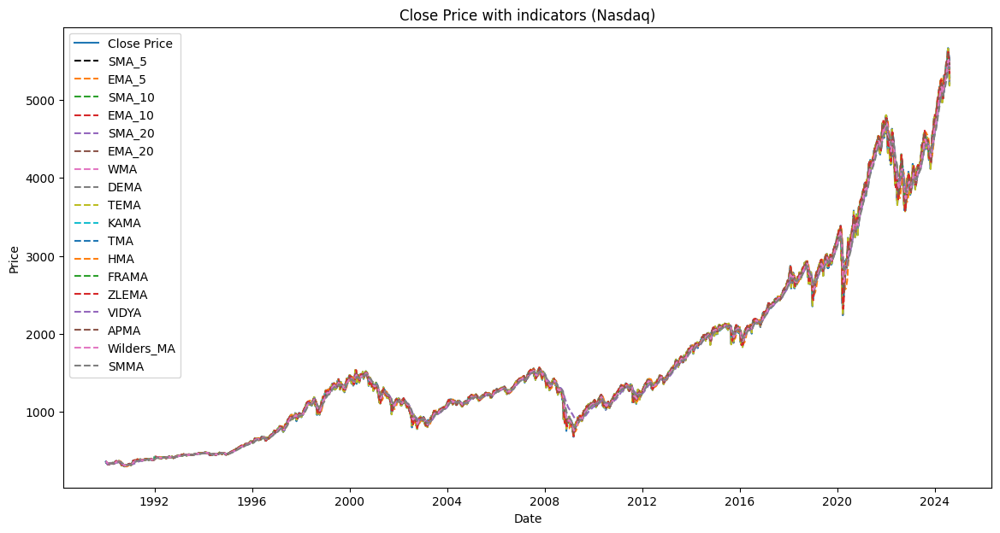

In [8]:
plt.figure(figsize=(14, 7))
plt.plot(dataset['Date'], dataset['Close'], label='Close Price')
plt.plot(dataset['Date'], dataset['SMA_5'],
         label='SMA_5', linestyle='--', color='black')
plt.plot(dataset['Date'], dataset['EMA_5'], label='EMA_5', linestyle='--')
plt.plot(dataset['Date'], dataset['SMA_10'], label='SMA_10', linestyle='--')
plt.plot(dataset['Date'], dataset['EMA_10'], label='EMA_10', linestyle='--')
plt.plot(dataset['Date'], dataset['SMA_20'], label='SMA_20', linestyle='--')
plt.plot(dataset['Date'], dataset['EMA_20'], label='EMA_20', linestyle='--')
plt.plot(dataset['Date'], dataset['WMA'], label='WMA', linestyle='--')
plt.plot(dataset['Date'], dataset['DEMA'], label='DEMA', linestyle='--')
plt.plot(dataset['Date'], dataset['TEMA'], label='TEMA', linestyle='--')
plt.plot(dataset['Date'], dataset['KAMA'], label='KAMA', linestyle='--')
plt.plot(dataset['Date'], dataset['TMA'], label='TMA', linestyle='--')
plt.plot(dataset['Date'], dataset['HMA'], label='HMA', linestyle='--')
plt.plot(dataset['Date'], dataset['FRAMA'], label='FRAMA', linestyle='--')
plt.plot(dataset['Date'], dataset['ZLEMA'], label='ZLEMA', linestyle='--')
plt.plot(dataset['Date'], dataset['VIDYA'], label='VIDYA', linestyle='--')
plt.plot(dataset['Date'], dataset['APMA'], label='APMA', linestyle='--')
plt.plot(dataset['Date'], dataset['Wilders_MA'],
         label='Wilders_MA', linestyle='--')
plt.plot(dataset['Date'], dataset['SMMA'], label='SMMA', linestyle='--')
plt.title('Close Price with indicators (Nasdaq)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

In [9]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt


n = 0
# remove VAMA
list_type = ['SMA_5', 'EMA_5', 'SMA_10', 'EMA_10', 'SMA_20', 'EMA_20', 'WMA', 'DEMA', 'TEMA', 'KAMA',
             'TMA', 'HMA', 'FRAMA', 'ZLEMA', 'VIDYA', 'APMA', 'Wilders_MA', 'SMMA']
rmse_values = []

while (n <= len(list_type)-1):
    rmse = sqrt(mean_squared_error(
        dataset['Close'][-20:], dataset[list_type[n]][-20:]))

    print(n+1, ". RMSE ", list_type[n], " =", rmse)
    rmse_values.append((list_type[n], rmse))
    n += 1

rmse_values.sort(key=lambda x: x[1])
print("****************************************")
print("top 10 RMSE values:")
for item in rmse_values[:10]:
    print(f"RMSE {item[0]} = {item[1]}")
print("****************************************")
n = 0
mae_values = []
while (n <= len(list_type)-1):
    mae = mean_absolute_error(
        dataset['Close'][-20:], dataset[list_type[n]][-20:])

    print(n+1, ". MAE ", list_type[n], " =", mae)
    mae_values.append((list_type[n], mae))
    n += 1

mae_values.sort(key=lambda x: x[1])
print("****************************************")
print("top 10 MAE values:")
for item in mae_values[:10]:
    print(f"MAE {item[0]} = {item[1]}")

print("****************************************")
print("Comparison between RMSE and MAE:")
for i in range(10):
    rmse_item = rmse_values[i]
    mae_item = mae_values[i]
    print(f"{i+1}. {rmse_item[0]
                    } -> RMSE = {rmse_item[1]}, MAE = {mae_item[1]}")

1 . RMSE  SMA_5  = 73.78770586803208
2 . RMSE  EMA_5  = 59.13028234357232
3 . RMSE  SMA_10  = 101.69030242222351
4 . RMSE  EMA_10  = 88.11259377524777
5 . RMSE  SMA_20  = 142.63748751177621
6 . RMSE  EMA_20  = 114.56406277778763
7 . RMSE  WMA  = 56.139795268636064
8 . RMSE  DEMA  = 35.80836819613461
9 . RMSE  TEMA  = 26.08147092290484
10 . RMSE  KAMA  = 125.00127144049138
11 . RMSE  TMA  = 150.52485722365049
12 . RMSE  HMA  = 193.65660068450353
13 . RMSE  FRAMA  = 112.97649814395652
14 . RMSE  ZLEMA  = 111.41985367954018
15 . RMSE  VIDYA  = 135.37634761725394
16 . RMSE  APMA  = 126.16445996680709
17 . RMSE  Wilders_MA  = 122.7171852457735
18 . RMSE  SMMA  = 150.2877408179093
****************************************
top 10 RMSE values:
RMSE TEMA = 26.08147092290484
RMSE DEMA = 35.80836819613461
RMSE WMA = 56.139795268636064
RMSE EMA_5 = 59.13028234357232
RMSE SMA_5 = 73.78770586803208
RMSE EMA_10 = 88.11259377524777
RMSE SMA_10 = 101.69030242222351
RMSE ZLEMA = 111.41985367954018
RMSE F

Comparison between RMSE and MAE:
1. TEMA -> RMSE = 26.08147092290484, MAE = 21.12875282098971
2. DEMA -> RMSE = 35.80836819613461, MAE = 27.034378778468817
3. WMA -> RMSE = 56.139795268636064, MAE = 43.149331054687536
4. EMA_5 -> RMSE = 59.13028234357232, MAE = 45.63197608034356
5. SMA_5 -> RMSE = 73.78770586803208, MAE = 55.85332519531253
6. EMA_10 -> RMSE = 88.11259377524777, MAE = 68.52690693928544
7. SMA_10 -> RMSE = 101.69030242222351, MAE = 83.71882812499989
8. ZLEMA -> RMSE = 111.41985367954018, MAE = 89.44662204667483
9. FRAMA -> RMSE = 112.97649814395652, MAE = 91.16108839304039
10. EMA_20 -> RMSE = 114.56406277778763, MAE = 92.33112388260301

In [10]:
ticker = '^GSPC'
dataset_input = yf.download(ticker, start='1990-01-01',
                            end=datetime.now().strftime('%Y-%m-%d'), interval='1d')

combined_data = pd.DataFrame({
    'Date': dataset_input.index.tolist() * 2,
    'Price Type': ['Open'] * len(dataset_input['Open']) + ['Close'] * len(dataset_input['Close']),
    'Price': pd.concat([dataset_input['Open'], dataset_input['Close']], ignore_index=True)
})

# Sort the combined data by Date and Price Type
combined_data_sorted = combined_data.sort_values(
    by=['Date', 'Price Type']).reset_index(drop=True)

price_series = pd.to_numeric(combined_data_sorted['Price'], errors='coerce')
price_series = price_series.dropna()
period = 5
# Calculate DEMA and TEMA
data01 = calculate_DEMA(price_series, 10)
data02 = calculate_TEMA(price_series, 10)
dataWMA = price_series.rolling(window=period).apply(lambda prices: np.dot(
    prices, np.arange(1, period + 1))/np.arange(1, period + 1).sum(), raw=True)
dataSMA_5 = price_series.rolling(window=5).mean()
dataEMA_5 = price_series.ewm(span=5, adjust=False).mean()
dataSMA_10 = price_series.rolling(window=10).mean()
dataEMA_10 = price_series.ewm(span=10, adjust=False).mean()
dataZLEMA = calculate_ZLEMA(price_series, 28)
# dataFRAMA = calculate_FRAMA(price_series, 10)
dataEMA_20 = price_series.ewm(span=20, adjust=False).mean()

dataset_input1 = pd.DataFrame({
    'Close': price_series,
    'DEMA': data01,
    'TEMA': data02,
    'WMA': dataWMA,
    'SMA_5': dataSMA_5,
    'EMA_5': dataEMA_5,
    'SMA_10': dataSMA_10,
    'EMA_10': dataEMA_10,
    'ZLEMA': dataZLEMA,
    # 'FRAMA': dataFRAMA
    'EMA_20': dataEMA_20
})
print(dataset_input1.head())

[*********************100%%**********************]  1 of 1 completed

        Close        DEMA        TEMA        WMA       SMA_5       EMA_5  \
0  359.690002  359.690002  359.690002        NaN         NaN  359.690002   
1  353.399994  357.610661  356.845085        NaN         NaN  357.593333   
2  358.760010  357.851415  357.390234        NaN         NaN  357.982225   
3  359.690002  358.350053  358.216350        NaN         NaN  358.551484   
4  355.670013  357.399226  356.975430  357.32534  357.442004  357.590994   

   SMA_10      EMA_10       ZLEMA      EMA_20  
0     NaN  359.690002  359.690002  359.690002  
1     NaN  358.546365  358.822415  359.090954  
2     NaN  358.585209  358.753974  359.059436  
3     NaN  358.786081  358.818528  359.119490  
4     NaN  358.219523  358.324148  358.790968  


In [11]:
scaler_type = StandardScaler()
# Prepare the ETL instance
data = ETL(
    datainput=dataset_input1.dropna(),
    test_size=0.1,
    n_input=5,  # Look-back period
    timestep=10,  # Number of past days to use for each prediction
    normalize_bool=True,
    scaler=scaler_type
)

X_train, y_train = data.X_train, data.y_train
X_val, y_val = data.X_test, data.y_test
print(f"X_train shape: {data.X_train.shape}")
print(f"X_test shape: {data.X_test.shape}")
print(f"y_train shape: {data.y_train.shape}")
print(f"y_test shape: {data.y_test.shape}")

train:           Close      DEMA      TEMA       WMA     SMA_5     EMA_5    SMA_10  \
0     -1.098662 -1.097336 -1.098107 -1.097454 -1.096823 -1.097118 -1.095686   
1     -1.100851 -1.098718 -1.099736 -1.098841 -1.098374 -1.098416 -1.096542   
2     -1.097280 -1.098530 -1.099136 -1.098520 -1.098098 -1.098091 -1.096505   
3     -1.102811 -1.100190 -1.101161 -1.100136 -1.099517 -1.099719 -1.097478   
4     -1.100851 -1.100737 -1.101552 -1.100626 -1.100225 -1.100150 -1.098333   
...         ...       ...       ...       ...       ...       ...       ...   
15677  1.922974  1.937764  1.931111  1.931975  1.935755  1.931178  1.934524   
15678  1.924577  1.935059  1.927709  1.928767  1.932915  1.929511  1.934107   
15679  1.916815  1.930331  1.921860  1.923917  1.927330  1.925810  1.933285   
15680  1.929073  1.930766  1.923528  1.925016  1.925603  1.927432  1.933689   
15681  1.891186  1.918472  1.907589  1.914057  1.918473  1.915876  1.928735   

         EMA_10     ZLEMA    EMA_20  
0     

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


train_transformed shape: (1568, 10, 10)
test_transformed shape: (174, 10, 10)
1
X shape: (1568, 5, 10)
y shape: (1568, 5, 10)
1
X shape: (174, 5, 10)
y shape: (174, 5, 10)
normalized True
X_train shape: (1568, 5, 10)
X_test shape: (174, 5, 10)
y_train shape: (1568, 5, 10)
y_test shape: (174, 5, 10)


Epoch 1/25


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/layer.py:877: UserWarning: Layer 'query' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/layer.py:877: UserWarning: Layer 'key' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/layer.py:877: UserWarning: Layer 'value' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy th

49/49 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.4794 - mae: 0.5526 - mape: 323.4542 - val_loss: 2.2452 - val_mae: 1.3024 - val_mape: 55.8969
Epoch 2/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.1259 - mae: 0.2589 - mape: 182.3815 - val_loss: 0.1696 - val_mae: 0.2925 - val_mape: 12.5844
Epoch 3/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0462 - mae: 0.1641 - mape: 281.9097 - val_loss: 0.0289 - val_mae: 0.1379 - val_mape: 5.8939
Epoch 4/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0409 - mae: 0.1560 - mape: 174.1886 - val_loss: 0.0503 - val_mae: 0.2030 - val_mape: 8.6467
Epoch 5/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0315 - mae: 0.1344 - mape: 135.6663 - val_loss: 0.0236 - val_mae: 0.1298 - val_mape: 5.4939
Epoch 6/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0277 - mae: 0.1261 - mape: 161.8319 - val_loss: 0.0301 - val_mae: 0.1559 - val_mape: 6.7009
Epoch 7/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0236 - mae: 0.1155 - mape: 10

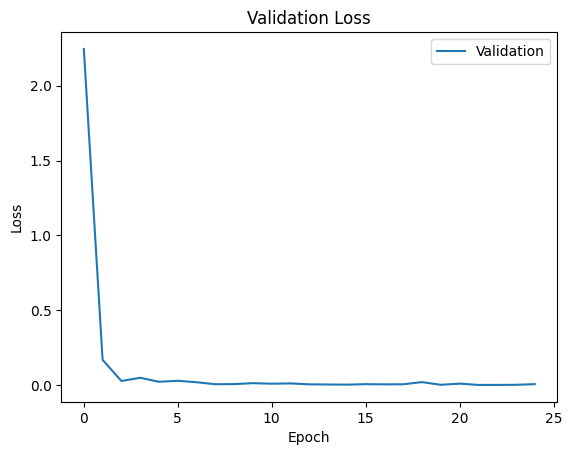

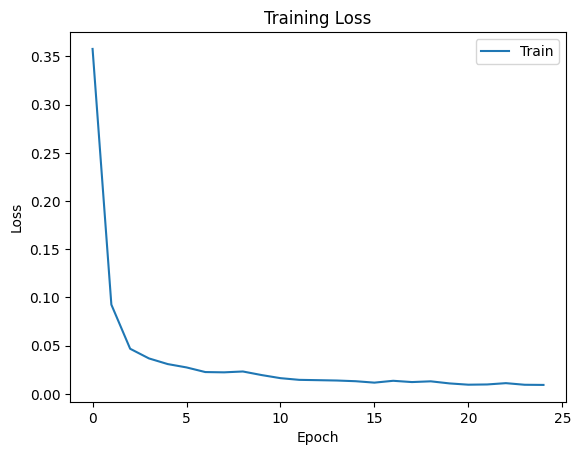

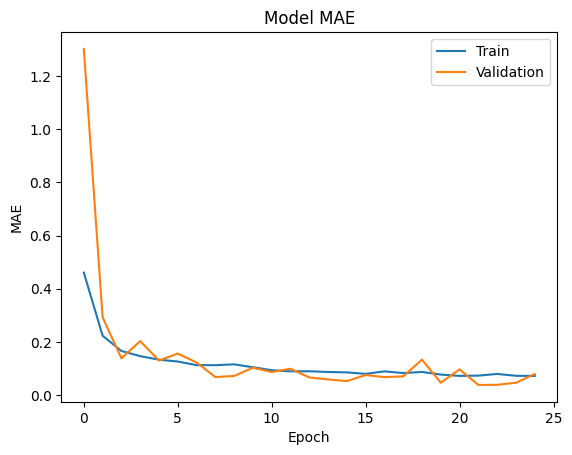

In [12]:
model = build_transformer(head_size=16, num_heads=4,
                          ff_dim=128, num_trans_blocks=12,
                          mlp_units=[64],
                          dropout=0.2, mlp_dropout=0.2)

fit_transformer(model, X_train, y_train, X_val, y_val, display_loss=True)

Predictions shape: (6600, 5, 10)
Predictions shape: (6600, 5, 10)
************************
Initial training series:
0       -1.098662
1       -1.097336
2       -1.098107
3       -1.097454
4       -1.096823
           ...   
78395    1.936615
78396    1.931789
78397    1.928572
78398    1.948970
78399    1.911592
Length: 78400, dtype: float64

train value 0       -1.098662
1       -1.097336
2       -1.098107
3       -1.097454
4       -1.096823
           ...   
78395    1.936615
78396    1.931789
78397    1.928572
78398    1.948970
78399    1.911592
Length: 78400, dtype: float64
origin value 0       1.898864
1       1.911874
2       1.900603
3       1.908034
4       1.913649
          ...   
8695    3.205613
8696    3.238708
8697    3.228882
8698    3.201500
8699    3.257462
Length: 8700, dtype: float64
***********************
Step 1:
Predicted value: 1.9280648502644397
Original value: 1.898863595744195
next prediction:78400    1.928065
Name: pred, dtype: float64
Kalman adjusted predict

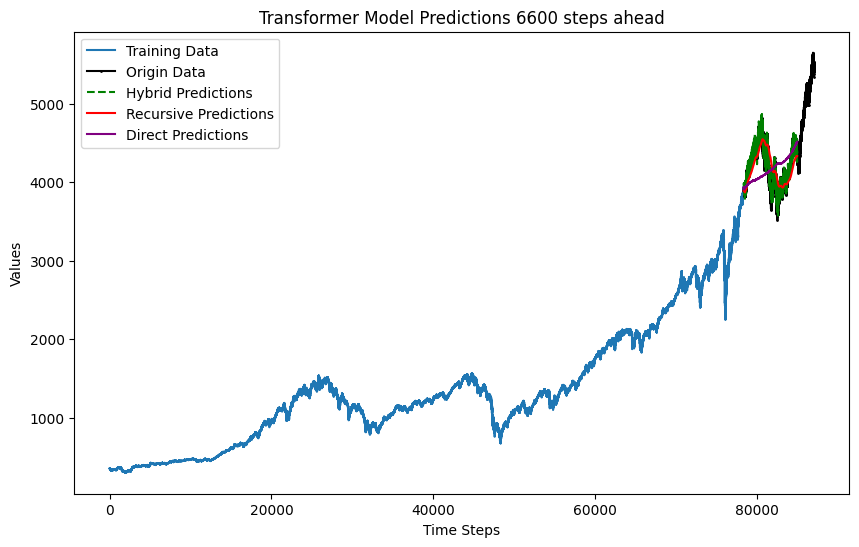

In [16]:
predict_and_forecast = PredictAndForecast(
    model, X_train, X_val,
    n_input=5
)
step_time_prediction = 6600

predictions = predict_and_forecast.get_predictions(step=step_time_prediction)
print(f'Predictions shape: {predictions.shape}')
predictions = np.array(predictions).flatten()

test_series, recursive_preds, direct_preds, hybrid_preds = predict_and_forecast.plot_predictions(
    steps=step_time_prediction, preds=predictions, normaliza_bool=True, scaler=scaler_type)

In [18]:
metrics = predict_and_forecast.evaluate_predictions(
    test_series, recursive_preds, direct_preds, hybrid_preds)
print(metrics)


Recursive Predictions:
MAE: 163.16400811085646
MAPE: 0.03897928199519515
RMSE: 197.4868998623079
R2: 0.47876938813049996

Direct Predictions:
MAE: 273.3014686622416
MAPE: 0.06471075780337612
RMSE: 325.7580887374702
R2: -0.41822045778319894

Hybrid Predictions:
MAE: 62.398944652127206
MAPE: 0.014992518231968066
RMSE: 82.4778324676356
R2: 0.9090866193652444
{'recursive': {'MAE': 163.16400811085646, 'MAPE': 0.03897928199519515, 'RMSE': 197.4868998623079, 'R2': 0.47876938813049996}, 'direct': {'MAE': 273.3014686622416, 'MAPE': 0.06471075780337612, 'RMSE': 325.7580887374702, 'R2': -0.41822045778319894}, 'hybrid': {'MAE': 62.398944652127206, 'MAPE': 0.014992518231968066, 'RMSE': 82.4778324676356, 'R2': 0.9090866193652444}}


Predictions shape: (8600, 5, 10)
Predictions shape: (8600, 5, 10)
************************
Initial training series:
0       -1.098662
1       -1.097336
2       -1.098107
3       -1.097454
4       -1.096823
           ...   
78395    1.936615
78396    1.931789
78397    1.928572
78398    1.948970
78399    1.911592
Length: 78400, dtype: float64

train value 0       -1.098662
1       -1.097336
2       -1.098107
3       -1.097454
4       -1.096823
           ...   
78395    1.936615
78396    1.931789
78397    1.928572
78398    1.948970
78399    1.911592
Length: 78400, dtype: float64
origin value 0       1.898864
1       1.911874
2       1.900603
3       1.908034
4       1.913649
          ...   
8695    3.205613
8696    3.238708
8697    3.228882
8698    3.201500
8699    3.257462
Length: 8700, dtype: float64
***********************
Step 1:
Predicted value: 1.9280648502644397
Original value: 1.898863595744195
next prediction:78400    1.928065
Name: pred, dtype: float64
Kalman adjusted predict

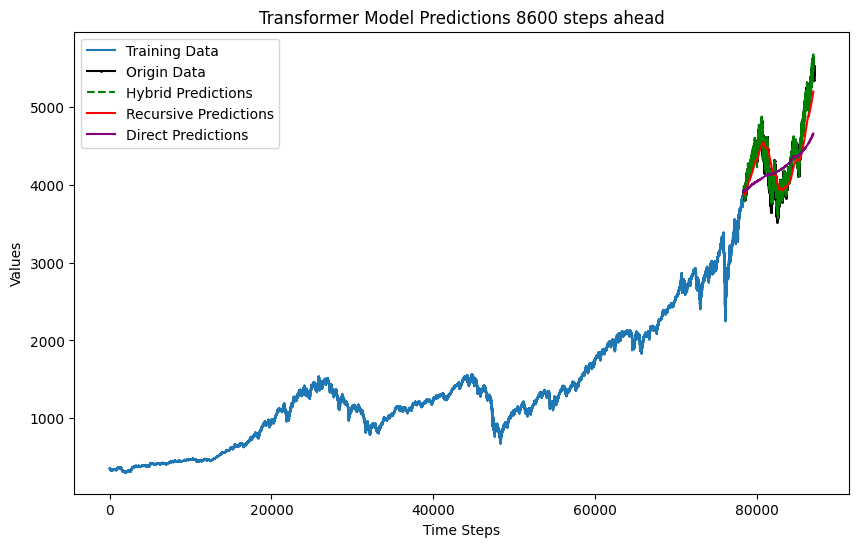

In [20]:
predict_and_forecast = PredictAndForecast(
    model, X_train, X_val,
    n_input=5
)
step_time_prediction = 8600

predictions = predict_and_forecast.get_predictions(step=step_time_prediction)
print(f'Predictions shape: {predictions.shape}')
predictions = np.array(predictions).flatten()

test_series, recursive_preds, direct_preds, hybrid_preds = predict_and_forecast.plot_predictions(
    steps=step_time_prediction, preds=predictions, normaliza_bool=True, scaler=scaler_type)

In [21]:
metrics = predict_and_forecast.evaluate_predictions(
    test_series, recursive_preds, direct_preds, hybrid_preds)
print(metrics)


Recursive Predictions:
MAE: 191.86472486364502
MAPE: 0.04308531701429418
RMSE: 229.42035427414356
R2: 0.7229824609487728

Direct Predictions:
MAE: 313.4428856401752
MAPE: 0.06921301433184457
RMSE: 382.6794272998575
R2: 0.22924987230990745

Hybrid Predictions:
MAE: 61.48392547841316
MAPE: 0.01429458543770477
RMSE: 80.8428580069495
R2: 0.9656025148540727
{'recursive': {'MAE': 191.86472486364502, 'MAPE': 0.04308531701429418, 'RMSE': 229.42035427414356, 'R2': 0.7229824609487728}, 'direct': {'MAE': 313.4428856401752, 'MAPE': 0.06921301433184457, 'RMSE': 382.6794272998575, 'R2': 0.22924987230990745}, 'hybrid': {'MAE': 61.48392547841316, 'MAPE': 0.01429458543770477, 'RMSE': 80.8428580069495, 'R2': 0.9656025148540727}}


Predictions shape: (10800, 5, 10)
Predictions shape: (10800, 5, 10)
************************
Initial training series:
0       -1.098662
1       -1.097336
2       -1.098107
3       -1.097454
4       -1.096823
           ...   
78395    1.936615
78396    1.931789
78397    1.928572
78398    1.948970
78399    1.911592
Length: 78400, dtype: float64

train value 0       -1.098662
1       -1.097336
2       -1.098107
3       -1.097454
4       -1.096823
           ...   
78395    1.936615
78396    1.931789
78397    1.928572
78398    1.948970
78399    1.911592
Length: 78400, dtype: float64
origin value 0       1.898864
1       1.911874
2       1.900603
3       1.908034
4       1.913649
          ...   
8695    3.205613
8696    3.238708
8697    3.228882
8698    3.201500
8699    3.257462
Length: 8700, dtype: float64
***********************
Step 1:
Predicted value: 1.9280648502644397
Original value: 1.898863595744195
next prediction:78400    1.928065
Name: pred, dtype: float64
Kalman adjusted predi

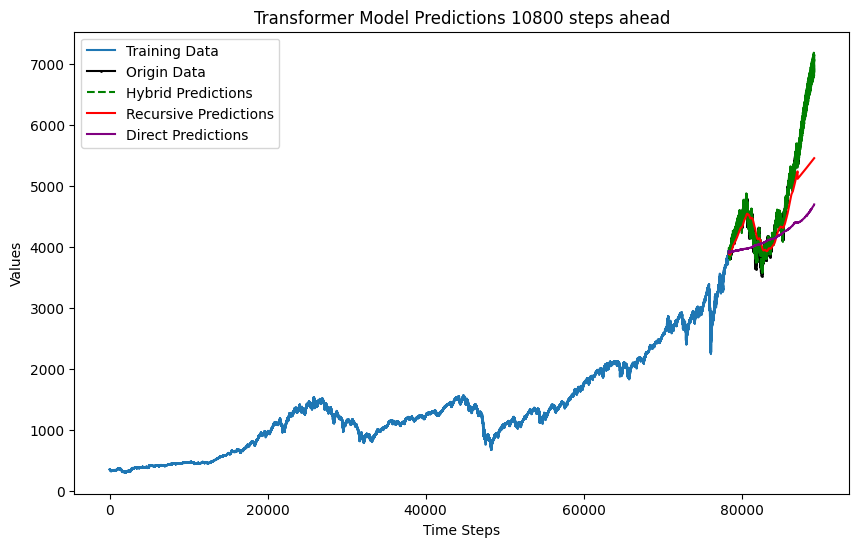

In [22]:
predict_and_forecast = PredictAndForecast(
    model, X_train, X_val,
    n_input=5
)
step_time_prediction = 10800

predictions = predict_and_forecast.get_predictions(step=step_time_prediction)
print(f'Predictions shape: {predictions.shape}')
predictions = np.array(predictions).flatten()

test_series, recursive_preds, direct_preds, hybrid_preds = predict_and_forecast.plot_predictions(
    steps=step_time_prediction, preds=predictions, normaliza_bool=True, scaler=scaler_type)